<a href="https://colab.research.google.com/github/Deyonrose/computer_vision/blob/main/2348513_cv_lab2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

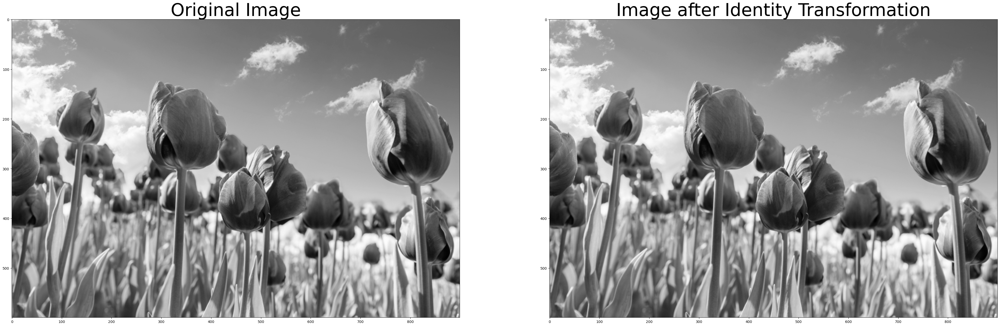

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read and convert the image to grayscale
img = cv2.imread('/content/purple-tulips-blooming.jpg', 0)  # Read image in grayscale

# Apply identity transformation
img1 = cv2.warpAffine(img, np.float32([[1, 0, 0], [0, 1, 0]]), (img.shape[1], img.shape[0]))

# Apply reflection transformation
img2 = cv2.flip(img, 0)  # 0 for horizontal flip, 1 for vertical flip, -1 for both

# Translation
tx, ty = 50, 50
mat_translate = np.float32([[1, 0, tx], [0, 1, ty]])
img9 = cv2.warpAffine(img, mat_translate, (img.shape[1], img.shape[0]))

# Scale the image (0.75 times along the x axis and 1.25 times along the y axis)
img3 = cv2.resize(img, None, fx=0.75, fy=1.25, interpolation=cv2.INTER_LINEAR)

# Rotate the image by 30° counter-clockwise
rows, cols = img.shape
M = cv2.getRotationMatrix2D((cols / 2, rows / 2), 30, 1)
img4 = cv2.warpAffine(img, M, (cols, rows))

# Apply shear transform to the image
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[50, 50], [200, 50], [100, 250]])
mat_shear = cv2.getAffineTransform(pts1, pts2)
img5 = cv2.warpAffine(img, mat_shear, (cols, rows))

# Display the transformed images
plt.figure(figsize=(50, 50))
plt.subplot(1,2 , 1), plt.imshow(img, cmap='gray'), plt.title('Original Image', fontsize=50)
plt.subplot(1, 2, 2), plt.imshow(img1, cmap='gray'), plt.title('Image after Identity Transformation', fontsize=50)
plt.show()


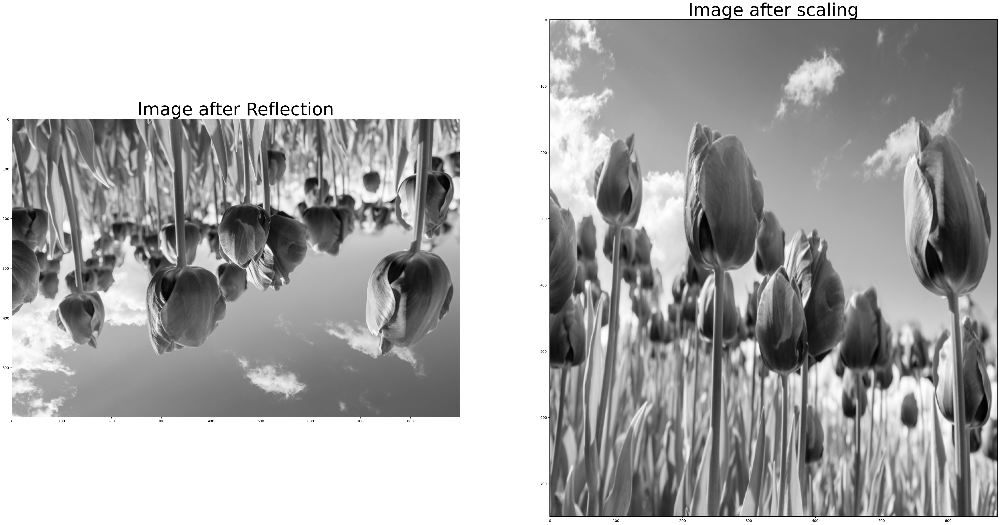

In [ ]:
plt.figure(figsize=(50, 50))

plt.subplot(1, 2, 1), plt.imshow(img2, cmap='gray'), plt.title('Image after Reflection', fontsize=50)
plt.subplot(1, 2, 2), plt.imshow(img3, cmap='gray'), plt.title('Image after scaling', fontsize=50)
plt.show()

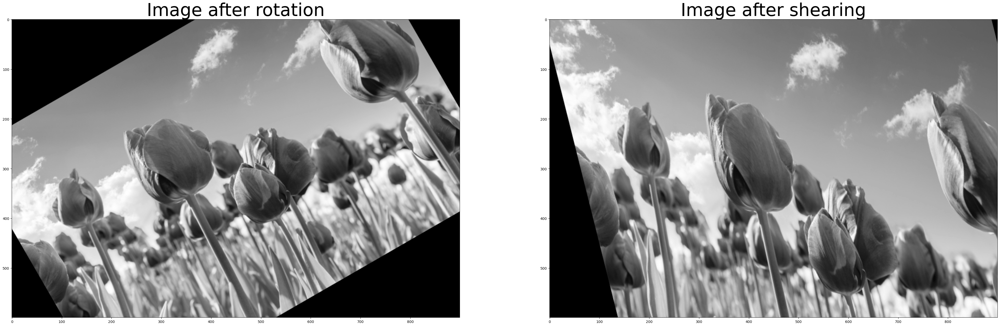

In [ ]:
plt.figure(figsize=(50, 50))

plt.subplot(1, 2, 1), plt.imshow(img4, cmap='gray'), plt.title('Image after rotation', fontsize=50)
plt.subplot(1, 2, 2), plt.imshow(img5, cmap='gray'), plt.title('Image after shearing', fontsize=50)
plt.show()

Text(0.5, 1.0, 'Translated image')

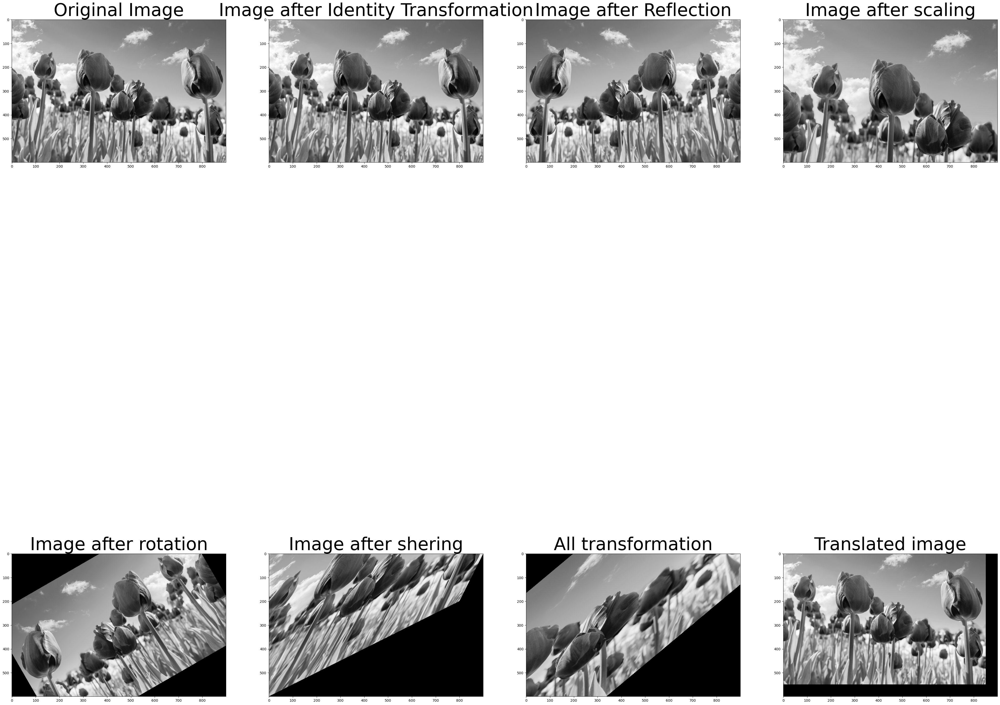

In [1]:
#using scipy
import numpy as np
from scipy import ndimage as ndi
from skimage.io import imread
#Scikit-image, or skimage, is an open source Python package designed for image preprocessing.
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

#read and convert the iamge in to gray
img = rgb2gray(imread('/content/purple-tulips-blooming.jpg'))
w, h = img.shape

#Apply identity transform:
mat_identity = np.array([[1,0,0],[0,1,0],[0,0,1]])
img1 = ndi.affine_transform(img, mat_identity)

#plt.imshow(img1)
#Apply reflection transform :

# Translation
tx,ty=50,50
mat_translate = np.array([[1,0,tx],[0,1,ty],[0,0,1]])
img9 = ndi.affine_transform(img, mat_translate) # offset=(0,h)


#Scale the image (0.75 times along the x axis and 1.25 times along the y axis):
s_x, s_y = 0.75, 0.75
mat_scale = np.array([[s_x,0,0],[0,s_y,0],[0,0,1]])
img3 = ndi.affine_transform(img, mat_scale)
#plt.imshow(img1)

#Rotate the image by 30° counter-clockwise.
#It's a composite operation—first, you will need to shift/center the image, apply rotation, and then apply inverse shift:
theta = np.pi/6
mat_rotate = np.array([[1,0,w/2],[0,1,h/2],[0,0,1]]) @ np.array([[np.cos(theta),np.sin(theta),0],[np.sin(theta),-np.cos(theta),0],[0,0,1]]) @ np.array([[1,0,-w/2],[0,1,-h/2],[0,0,1]])
img4 = ndi.affine_transform(img1, mat_rotate)

mat_reflect = np.array([[1,0,0],[0,-1,0],[0,0,1]]) @ np.array([[1,0,0],[0,1,-h],[0,0,1]])
img2 = ndi.affine_transform(img, mat_reflect) # offset=(0,h)

#Apply shear transform to the image:
lambda1 = 0.5
mat_shear = np.array([[1,lambda1,0],[lambda1,1,0],[0,0,1]])
img5 = ndi.affine_transform(img1, mat_shear)

#Finally apply all of the transforms together, in sequence:

mat_all = mat_identity @ mat_reflect @ mat_scale @ mat_rotate @ mat_shear
final=ndi.affine_transform(img, mat_all)


fig, ax = plt.subplots(nrows=2, ncols=4, figsize=(50, 50))
ax[0, 0].imshow(img,"gray")
ax[0, 0].set_title('Original Image',fontsize = 50)
ax[0, 1].imshow(img1,"gray")
ax[0, 1].set_title('Image after Identity Transformation',fontsize = 50)
ax[0, 2].imshow(img2, "gray")
ax[0, 2].set_title('Image after Reflection',fontsize = 50)
ax[0, 3].imshow(img3, "gray")
ax[0, 3].set_title('Image after scaling',fontsize = 50)
ax[1, 0].imshow(img4, "gray")
ax[1, 0].set_title('Image after rotation',fontsize = 50)
ax[1, 1].imshow(img5, "gray")
ax[1, 1].set_title('Image after shering',fontsize = 50)
ax[1, 2].imshow(final, "gray")
ax[1, 2].set_title('All transformation',fontsize = 50)

ax[1, 3].imshow(img9,"gray")
ax[1, 3].set_title('Translated image',fontsize = 50)
